# **Odyssey**
### FINCH's navigator

Scope: Odyssey generates the ADCS pointing profiles needed for the mission. These are the set of rotations fed into the flight computer to tell which way the spacecraft needs to point at all times.

## Setup


---



In [3]:
#@title ## SETUP: Install Dependencies { display-mode: "form" }
#@markdown Click the run button on this cell to install dependencies. It will take up to one minute.

%%capture
!pip install poliastro
!pip install mpld3

In [4]:
#@title SETUP: Imports

import numpy as np

import pandas as pd
%load_ext google.colab.data_table

from astropy.time import Time
from astropy import units as u
from astropy.coordinates import SkyCoord, EarthLocation, GCRS, ITRS, AltAz, CartesianRepresentation, CartesianDifferential, get_body, solar_system_ephemeris
from astropy import coordinates as coord

from poliastro.bodies import Earth, Sun
from poliastro.twobody import Orbit
from poliastro.core.perturbations import J2_perturbation, shadow_function
from poliastro.twobody.propagation import cowell, propagate
from poliastro.ephem import Ephem
solar_system_ephemeris.set("jpl")

%matplotlib inline
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d

from ipywidgets import interact
import ipywidgets as widgets

from scipy.spatial.transform import Rotation

print("Imports complete")

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table
Imports complete


## Define the Orbit


---


We use Poliastro to help us compute the parameters of a Sun Synchronous Orbit, based on our desired LTAN.

Get our orbital parameters from [here](http://spacesys.utat.ca/confluence/display/FIN/Current+Orbital+Parameters)

**SMA**: Semi-Major Axis (km)

**LTAN**: Local Time at Ascending Node -- exactly 12 hours difference from LTDN. Input as a number of hours from 0 to 24.

**Eccentricity**: Eccentricity of orbit (0 to 1)

**Argument of Perigee**: Angle from 0 to 360 degrees

**Total Anomaly**: How far you are along the orbit, from 0 to 360 degrees

**Epoch**: When these parameters hold true. Input date using the form. Input time format at "HH:MM" (24 hour time, UTC)

*NOTE: Output format will show time as (TDB); Do not worry, as this is just used as an intermediate step. The real UTC time is kept.*

In [5]:
#@title Orbit Parameters
SMA =  6878#@param {type:"number"}
LTAN =  22.5#@param {type:"number"}
Eccentricity = 0 #@param {type:"number"}
argument_of_perigee = 0 #@param {type:"number"}
total_anomaly = 0 #@param {type:"number"}
epoch_date = "2024-06-01" #@param {type:"date"}
epoch_time = "00:00" #@param {type:"string"}

# convert parameters to dimensionful values
a = SMA * u.km
e = Eccentricity * u.one
argpe = argument_of_perigee * u.deg
ta = total_anomaly * u.deg
LTAN = LTAN*u.hourangle

# Store time as UTC
epoch = Time(f"{epoch_date} {epoch_time}", format='iso', scale="utc")

# Define orbital parameters, along with units
orb = Orbit.heliosynchronous(attractor=Earth, a=a, ecc=e, ltan=LTAN, argp=argpe, nu=ta, epoch=epoch)

print(orb.classical())

orb
# Time in orbit is now stored as TDB

(<Quantity 6878. km>, <Quantity 0.>, <Quantity 97.40096011 deg>, <Angle 587.05566154 deg>, <Quantity 0. deg>, <Quantity 0. deg>)


6878 x 6878 km x 97.4 deg (GCRS) orbit around Earth (♁) at epoch 2024-06-01 00:01:09.185 (TDB)

## Propagate the Orbit

---


We use a simple propagator model with only J2 (for the purpose of short term sims)

**num_days**: Number of days to propagate forwards to.

**num_steps**: Number of integration steps used.

In [6]:
#@title Propagation Parameters

#@markdown We use Cowell's method to numerically integrate the spacecraft's postion forward, accounting for J2 pertubations, which are responsible for maintaing Sun synchronicity.

num_days =  2#@param {type:"number"}
num_steps =  10000#@param {type:"integer"}

tof = (num_days * u.d).to(u.s) # time in seconds

times = np.linspace(0, tof, num_steps)

# Obtain propagated positions and velocities using Cowell's method, applying J2 perturbations
propagated_positions = propagate(orb, times, method=cowell, ad=J2_perturbation, J2=Earth.J2.value, R=Earth.R.to(u.km).value)
propagated_velocities = propagated_positions.differentials["s"]

# Obtain jd dates along the propagation steps to feed into astropy as position data
# We work in TDB for propagation since the orbit data is stored in TDB
observation_times = Time(np.linspace(0, num_days, num_steps) + orb.epoch.jd, format="jd", scale="tdb")
observation_times.format = "iso"

# plug everything into AstroPy; positions, velocities, times
sky_coordinates = SkyCoord(frame=GCRS(obstime=observation_times), 
                           x=propagated_positions.x,
                           y=propagated_positions.y,
                           z=propagated_positions.z,
                           v_x=propagated_velocities.d_x,
                           v_y=propagated_velocities.d_y,
                           v_z=propagated_velocities.d_z,
                           representation_type = "cartesian",
                           differential_type = "cartesian")
print(f"Cowell Propagation successful to {sky_coordinates[-1].obstime.utc} UTC")


Cowell Propagation successful to 2024-06-03 00:00:00.000 UTC


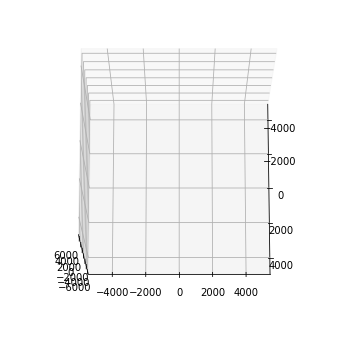

In [68]:
#@title ## Let's animate our orbit!
#@markdown This will take a bit to run (1 to 2 mins), but it looks pretty neat!
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


fig = plt.figure(figsize=(6, 6))

maxima = (max(sky_coordinates.x.value), max(sky_coordinates.y.value), max(sky_coordinates.z.value))
minima = (min(sky_coordinates.x.value), min(sky_coordinates.y.value), min(sky_coordinates.z.value))

ax = plt.axes(projection="3d", xlim = ((minima[0], maxima[0])),
              ylim = ((minima[1], maxima[1])),
              zlim = ((minima[2], maxima[2])))

sc, = ax.plot([], [], [])
dot, = ax.plot([], [], [], "og", markersize=10)

def init():
  ax.view_init(azim=0, elev=75)
  sc.set_data([], [])
  sc.set_3d_properties([])
  dot.set_data([], [])
  dot.set_3d_properties([])
  return (sc, dot)

elevation_angle = 60 #@param {type:"slider", min:0, max:90, step:1}
FRAMES = 2000 #@param {type:"slider", min:0, max:2000, step:1}
rotation_rate = 0.5 #@param {type:"slider", min:0, max:1, step:0.01}

def animate(i):
  ax.view_init(azim= rotation_rate*i%360, elev=elevation_angle)
  effective_frame = int(i/FRAMES * num_steps)

  sc.set_data(sky_coordinates.x.value[:effective_frame],
              sky_coordinates.y.value[:effective_frame])
  sc.set_3d_properties(sky_coordinates.z.value[:effective_frame])

  dot.set_data(sky_coordinates.x.value[effective_frame],
              sky_coordinates.y.value[effective_frame])
  dot.set_3d_properties(sky_coordinates.z.value[effective_frame])

  return (sc, dot)

anim = FuncAnimation(fig, animate, init_func=init, frames=FRAMES,
                     interval = 30, blit=False)

HTML(anim.to_html5_video())

## Simple Pointing Profiles


---

To begin, we're going to assume that the spacecraft only needs to point straight away from Earth in sun-safe mode.


In [234]:
#@title ### First let's define some rotation helper code
#@markdown This helps us calculate the rotation from the ECI frame given an input direction we want to rotate to.


#@markdown This code took some special numpy magic ✨to make it run fast.

def skew(x):
    '''
    Returns the skew of a 3x3 input matrix
    '''
    return np.transpose(np.array([[np.zeros(x.shape[0]), -x[:, 2], x[:, 1]],
                     [x[:, 2], np.zeros(x.shape[0]), -x[:, 0]],
                     [-x[:, 1], x[:, 0], np.zeros(x.shape[0])]]), axes=(2,0,1))
    
def rotation(sat_z):
  '''
  Calculate Rotation object based on a series of target orientation vectors wrt +z in ECI
  Based on https://math.stackexchange.com/questions/180418/calculate-rotation-matrix-to-align-vector-a-to-vector-b-in-3d
  '''
  ref_vector = np.array((0, 0, 1)) # reference upward direction

  normalized_sat_z = sat_z / np.linalg.norm(sat_z, axis=1)[:, np.newaxis] # normalize the vectors
  
  v = np.cross(ref_vector[np.newaxis, :], normalized_sat_z, axis=1) # cross of difference between the unit vectors

  sine = np.linalg.norm(v, axis=1) # sin of angle
  cosine = np.tensordot(ref_vector[np.newaxis, :], normalized_sat_z, axes=(1, 1))[0] # cos of angle 
  # TODO this step can still be optimized I think.

  matrix = np.eye(3, 3)[np.newaxis, :,:] + skew(v) + (np.matmul(skew(v), skew(v))) * ((1-cosine)/sine**2)[:, np.newaxis, np.newaxis]
    
  return Rotation.from_matrix(matrix)

In [246]:
#@title ## Next we will feed in our position vectors as our reference vector
#@markdown This is because the spacecraft points directly away from Earth, in the direction of its ECI position vector.

ECI_vectors = np.row_stack((sky_coordinates.x, sky_coordinates.y, sky_coordinates.z)).value.T
# Get the ECI Vector

rotations = rotation(ECI_vectors)
print(f"{len(rotations)} rotation points computed.")


10000 rotation points computed.


In [ ]:
#@title ### This function is really fast, btw
#@markdown Run this cell to get the runtime for 10000 vectors; it's around 0.7 microseconds per vector
%timeit rotations = rotation(ECI_vectors)

In [255]:
#@title ## Now we can get the pointing profiles
#@markdown Stick everything into a dataframe with a time. Rotations are represented as quaternions.
df = pd.DataFrame(data={"Time": observation_times.utc.value, "i": rotations.as_quat()[:, 0], "j": rotations.as_quat()[:, 1], "k": rotations.as_quat()[:, 2], "Real": rotations.as_quat()[:, 3]})

In [256]:
df

,Time,i,j,k,Real
0,2024-06-01 00:00:00.000,0.517613,-0.481743,0.0,0.707107
1,2024-06-01 00:00:17.282,0.511504,-0.478414,0.0,0.713781
2,2024-06-01 00:00:34.563,0.505367,-0.475016,0.0,0.720391
3,2024-06-01 00:00:51.845,0.499203,-0.471550,0.0,0.726937
4,2024-06-01 00:01:09.127,0.493012,-0.468016,0.0,0.733416
...,...,...,...,...,...
9995,2024-06-02 23:58:50.873,-0.461042,0.367825,0.0,0.807555
9996,2024-06-02 23:59:08.155,-0.466005,0.373852,0.0,0.801919
9997,2024-06-02 23:59:25.437,-0.470909,0.379861,0.0,0.796210
9998,2024-06-02 23:59:42.718,-0.475753,0.385851,0.0,0.790429


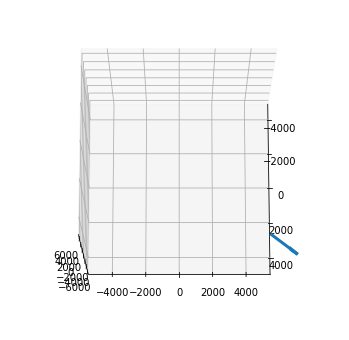

In [269]:
#@title ## Let's animate our pointing profile!
#@markdown We will use our old code to show this.
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig = plt.figure(figsize=(6, 6))

maxima = (max(sky_coordinates.x.value), max(sky_coordinates.y.value), max(sky_coordinates.z.value))
minima = (min(sky_coordinates.x.value), min(sky_coordinates.y.value), min(sky_coordinates.z.value))

ax = plt.axes(projection="3d", xlim = ((minima[0], maxima[0])),
              ylim = ((minima[1], maxima[1])),
              zlim = ((minima[2], maxima[2])))

sc, = ax.plot([], [], [])
dot, = ax.plot([], [], [], "og", markersize=10)

quiver = ax.quiver([], [], [], [], [], [])

def init():
  ax.view_init(azim=0, elev=75)
  sc.set_data([], [])
  sc.set_3d_properties([])
  dot.set_data([], [])
  dot.set_3d_properties([])
  return (sc, dot)

elevation_angle = 60 #@param {type:"slider", min:0, max:90, step:1}
FRAMES = 2000 #@param {type:"slider", min:0, max:2000, step:1}
rotation_rate = 0.5 #@param {type:"slider", min:0, max:1, step:0.01}

def get_arrow(n):
  effective_frame = int(n/FRAMES * num_steps)
  x = sky_coordinates.x.value[effective_frame]
  y = sky_coordinates.y.value[effective_frame]
  z = sky_coordinates.z.value[effective_frame]
  u, v, w = rotations[effective_frame].apply(np.array([0, 0, 1]))
  return x, y, z, u, v, w

def animate(i):
  ax.view_init(azim= rotation_rate*i%360, elev=elevation_angle)
  effective_frame = int(i/FRAMES * num_steps)

  sc.set_data(sky_coordinates.x.value[:effective_frame],
              sky_coordinates.y.value[:effective_frame])
  sc.set_3d_properties(sky_coordinates.z.value[:effective_frame])

  dot.set_data(sky_coordinates.x.value[effective_frame],
              sky_coordinates.y.value[effective_frame])
  dot.set_3d_properties(sky_coordinates.z.value[effective_frame])

  global quiver
  quiver.remove()
  quiver = ax.quiver(*get_arrow(i), length=2000, lw=3, normalize=True)

  return (sc, dot)

anim = FuncAnimation(fig, animate, init_func=init, frames=FRAMES,
                     interval = 30, blit=False)

HTML(anim.to_html5_video())